# Predição de Attrition (Turnover)

Enunciado do Desafio:

> Você acaba de receber um dataset dos funcionários de uma empresa. Objetivo principal é que você identifique fatores que tem influencia sobre o attrition, e assim, contribuir com insights para a área de Cultura e Pessoas da empresa. Sinta-se à vontade para construir os gráficos, análises estatísticas e modelo de machine learning que acharn necessário para prever o evento.

Esse notebook consiste em uma análise exploratória dos dados no dataset `Dataset.xlsx`, bem como a construção e comparação de 2 modelos de Machine Learning para classificar uma nova entrada como `Attrition` (1) ou não (0).

Ao rodar esse notebook, certifique-se que ele se encontra na mesma pasta que a planilha supracitada.

In [1]:
# Pacotes utilizados no notebook (descomentar e executar essa célula caso esteja rodando pela primeira vez)

# !pip install matplotlib
# !pip install numpy
# !pip install pandas
# !pip install pandas_profiling
# !pip install scipy
# !pip install seaborn
# !pip install sklearn
# !pip install statsmodels

In [2]:
# Importações das bibliotecas e métodos utilizados

# Bibliotecas core
import pandas as pd
import numpy as np

# Visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

# Testes de Hipóteses
from scipy.stats import ttest_ind
from statsmodels.stats.proportion import proportions_ztest

# Machine Learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    precision_score, 
    recall_score, 
    f1_score,
    plot_confusion_matrix, 
    plot_roc_curve, 
    plot_precision_recall_curve
)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


pd.set_option('display.max_columns', None)  # Forçar pandas a exibir todas as colunas de um dataframe
sns.set(style='whitegrid', rc={'figure.figsize':(9, 6)})  # Tamanho e estilo padrão dos gráficos

In [3]:
df_original = pd.read_excel('Dataset.xlsx', sheet_name='Dados')

print(df_original.shape)
df_original.head(10)

(1470, 35)


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [4]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [5]:
df_original.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


## Primeiras percepções

* 1470 observações sem nenhum dado faltante - _Amém_ ;
* Maioria das colunas é numérica;
* Há variáveis dicotômicas (Yes/No) que precisam ser encodadas;
* Colunas sem informações relevantes para análise (descartáveis): `EmployeeCount`, `StandardHours`, `Over18`;
* Distribuições coerentes, aparentemente sem muitos _outliers_.

In [6]:
# Limpeza do dataset: Tornar variáveis mais adequadas para profiling e análises

yes_no_map = {'Yes': 1, 'Y': 1, 'No': 0, 'N': 0}

gender_map = {'Male': 0, 'Female': 1}

education_map = { # Transformar em anos de escolaridade
    1: 9,         # Fundamental (9 anos) - impreciso!
    2: 9+3,       # Ensino Médio (+3 years)
    3: 9+3+5,     # Graduação (+5 years)
    4: 9+3+5+2,   # Mestrado (+2 years)
    5: 9+3+5+2+4  # Doutorado (+4 years)
}

travel_map = {
    'Non-Travel': 0,
    'Travel_Rarely': 1,
    'Travel_Frequently': 2
}

df = df_original.replace({
    'Attrition': yes_no_map,
    'BusinessTravel': travel_map,
    'Education': education_map,
    'Gender': gender_map,
    'Over18': yes_no_map,
    'OverTime': yes_no_map,
})

df.rename(columns={'EmployeeNumber':'ID'}, inplace=True)
df.set_index('ID', inplace=True)
df.drop(columns=['EmployeeCount', 'StandardHours', 'Over18'], inplace=True)  # Constantes

print(df.shape)
df.head()

(1470, 31)


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,41,1,1,1102,Sales,1,12,Life Sciences,2,1,94,3,2,Sales Executive,4,Single,5993,19479,8,1,11,3,1,0,8,0,1,6,4,0,5
2,49,0,2,279,Research & Development,8,9,Life Sciences,3,0,61,2,2,Research Scientist,2,Married,5130,24907,1,0,23,4,4,1,10,3,3,10,7,1,7
4,37,1,1,1373,Research & Development,2,12,Other,4,0,92,2,1,Laboratory Technician,3,Single,2090,2396,6,1,15,3,2,0,7,3,3,0,0,0,0
5,33,0,2,1392,Research & Development,3,19,Life Sciences,4,1,56,3,1,Research Scientist,3,Married,2909,23159,1,1,11,3,3,0,8,3,3,8,7,3,0
7,27,0,1,591,Research & Development,2,9,Medical,1,0,40,3,1,Laboratory Technician,2,Married,3468,16632,9,0,12,3,4,1,6,3,3,2,2,2,2


## Profiling dos dados para Análise Exploratória

Geração de um relatório de perfil dos dados usando a biblioteca `Pandas Profiling`.

In [7]:
profile = ProfileReport(df.reset_index(drop=True), title="Pandas Profiling Report - Case Attrition")

profile

Summarize dataset:   0%|          | 0/44 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Destaques mostrados no relatório**

- Forte correlação entre: `JobLevel` vs `MonthlyIncome`; `JobRole` vs `Department` -> importante manter apenas uma de cada nos modelos para evitar redundância/multicolinearidade;
- Correlação **quase nula** entre `Attrition` e: `HourlyRate`, `MonthlyRate`, `NumCompaniesWorked`, `PercentSalaryHike` e `PerformanceRating`;
- Dataset **desbalanceado** na variável resposta `Attrition`: **para cada 1 attrition há 5 no-attrition** (16%).

In [8]:
# Criação de uma variável dicotômica PromotedAtCompany: 1 = recebeu promoção na empresa atual; 0 = não recebeu.
promoted = df['YearsSinceLastPromotion'] < df['YearsAtCompany']
df['PromotedAtCompany'] = promoted.astype(int)

df['PromotedAtCompany'].head()

ID
1    1
2    1
4    0
5    1
7    0
Name: PromotedAtCompany, dtype: int64

In [9]:
df_small = df.drop(columns=[
#     Redundantes:
    'JobLevel',
    'Department',
#     Correlação quase nula com Attrition:
    'HourlyRate',
    'MonthlyRate',
    'NumCompaniesWorked',
    'PercentSalaryHike',
    'PerformanceRating'
])

print(df_small.shape)

(1470, 25)


### Comportamento de Attrition em variáveis numéricas

Indagação: 
> - Será que, em alguma variável numérica, existe discrepância na distribuição dessa variável entre colaboradores 
que deixaram a empresa, em comparação com os que não deixaram?
- Será que há evidência estatística suficeinte para afirmar que a média da variável quando há attrition é diferente da média quando não há attrition?

Validação:
- Verificar se há diferença nítida entre as distribuições quando há attrition e quando não há usando gráficos de distribuição de densidade;
- Aplicar teste de hipóteses para diferença de médias entre duas populações (com attrition e não attrition). P-valor baixo implica que há diferença significativa.

Comparação para Age


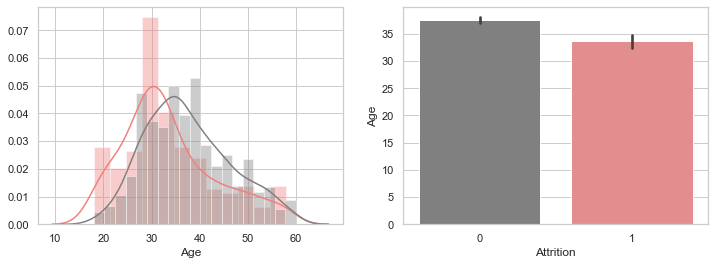

Attrition
0    37.561233
1    33.607595
Name: Age, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 1.3797600649439775e-08


Comparação para BusinessTravel


/Users/vitorfaria/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


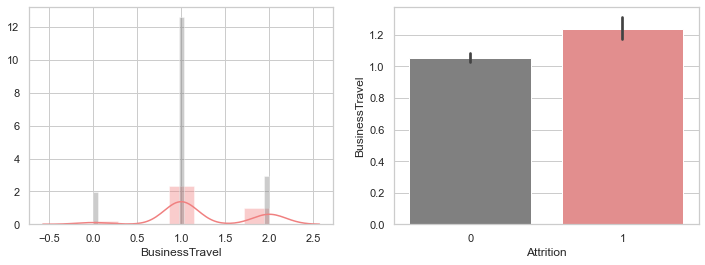

Attrition
0    1.056772
1    1.240506
Name: BusinessTravel, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 1.8026671208803053e-06


Comparação para DailyRate


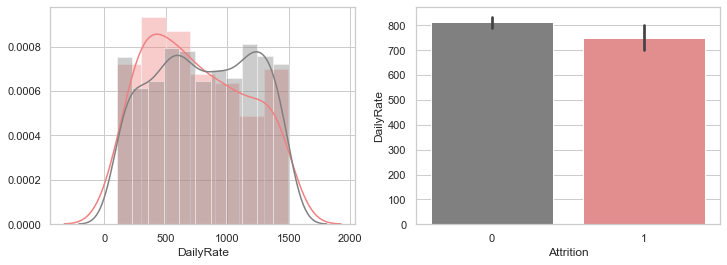

Attrition
0    812.504461
1    750.362869
Name: DailyRate, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.030039538210293225


Comparação para DistanceFromHome


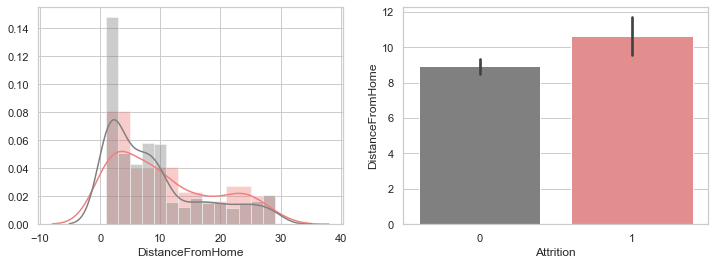

Attrition
0     8.915653
1    10.632911
Name: DistanceFromHome, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.004136511971511406


Comparação para Education


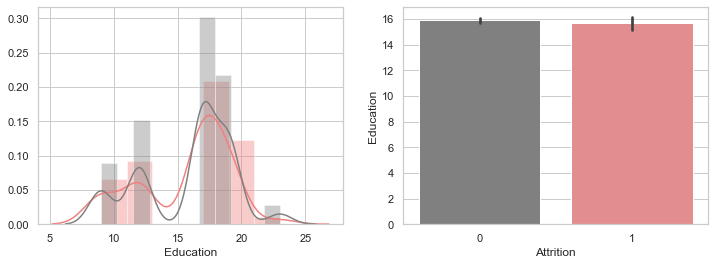

Attrition
0    15.893755
1    15.641350
Name: Education, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.3242792429705069


Comparação para EnvironmentSatisfaction


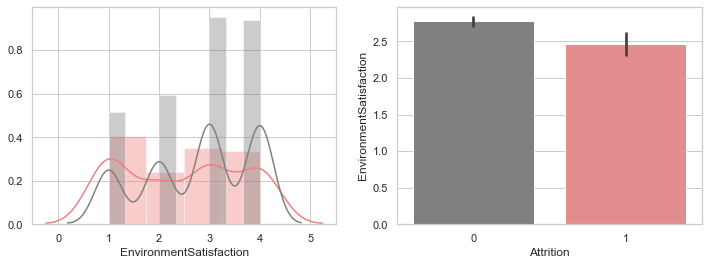

Attrition
0    2.771290
1    2.464135
Name: EnvironmentSatisfaction, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.0002092053345883392


Comparação para JobInvolvement


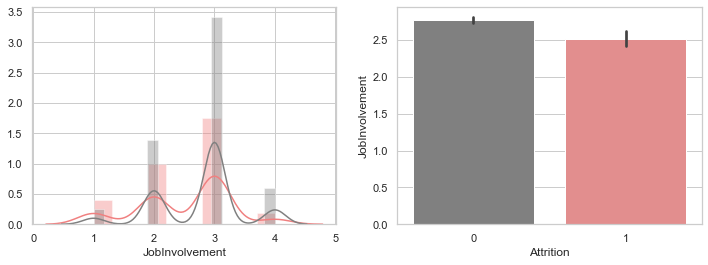

Attrition
0    2.770479
1    2.518987
Name: JobInvolvement, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 4.681194598626319e-06


Comparação para JobSatisfaction


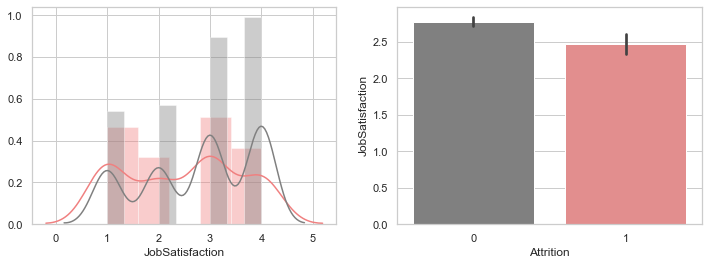

Attrition
0    2.778589
1    2.468354
Name: JobSatisfaction, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.0001052049107397441


Comparação para MonthlyIncome


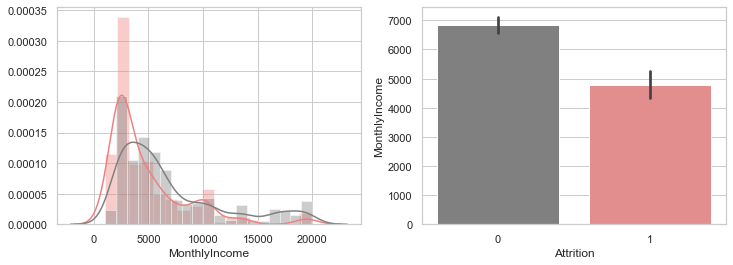

Attrition
0    6832.739659
1    4787.092827
Name: MonthlyIncome, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 4.433588628286071e-13


Comparação para RelationshipSatisfaction


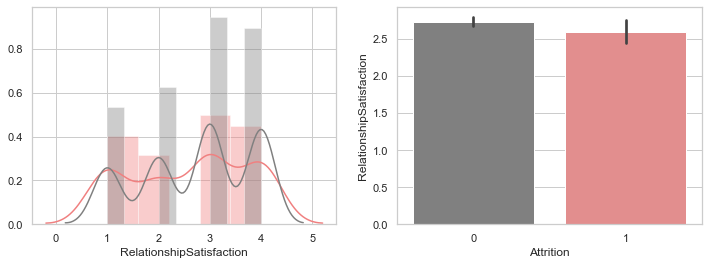

Attrition
0    2.733982
1    2.599156
Name: RelationshipSatisfaction, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.08972776285639437


Comparação para StockOptionLevel


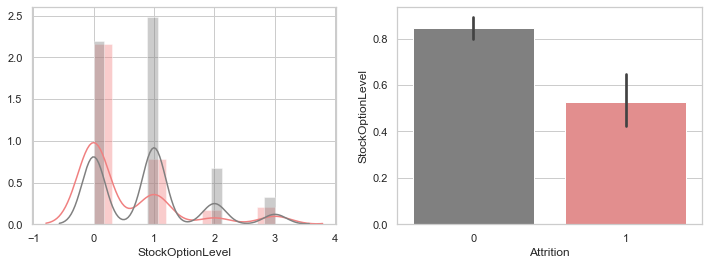

Attrition
0    0.845093
1    0.527426
Name: StockOptionLevel, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 2.811541457772157e-07


Comparação para TotalWorkingYears


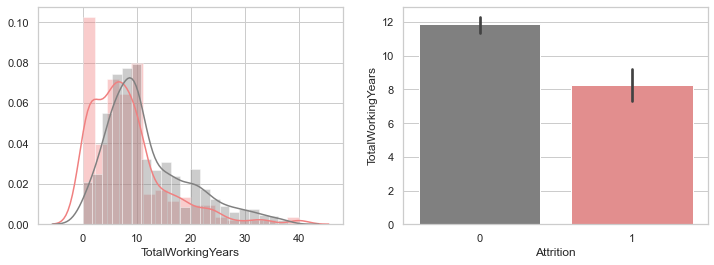

Attrition
0    11.862936
1     8.244726
Name: TotalWorkingYears, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 1.159816752806911e-11


Comparação para TrainingTimesLastYear


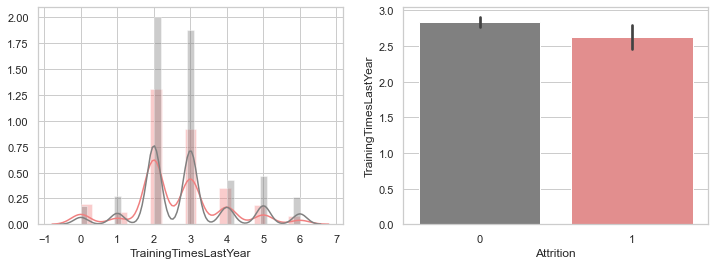

Attrition
0    2.832928
1    2.624473
Name: TrainingTimesLastYear, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.02036379212698693


Comparação para WorkLifeBalance


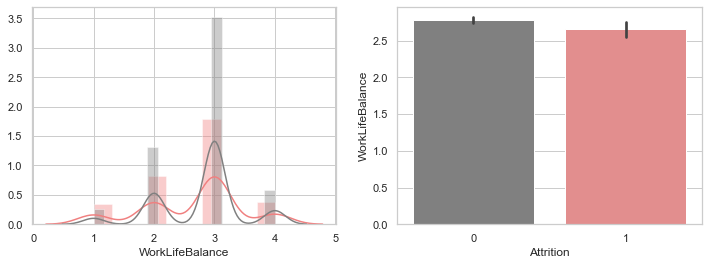

Attrition
0    2.781022
1    2.658228
Name: WorkLifeBalance, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.030465673913461576


Comparação para YearsAtCompany


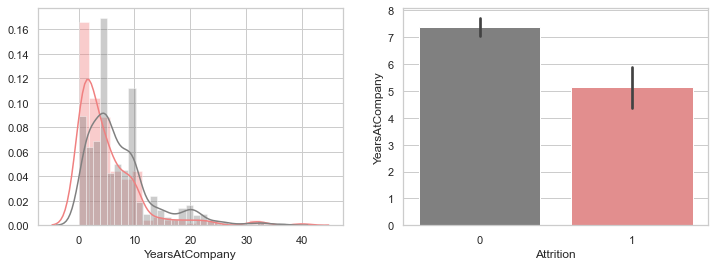

Attrition
0    7.369019
1    5.130802
Name: YearsAtCompany, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 2.2859051752725144e-07


Comparação para YearsInCurrentRole


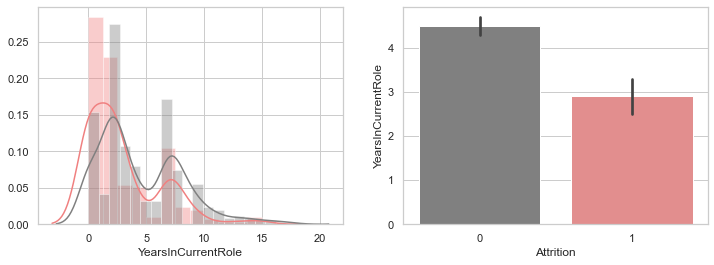

Attrition
0    4.484185
1    2.902954
Name: YearsInCurrentRole, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 3.1873903722051294e-11


Comparação para YearsSinceLastPromotion


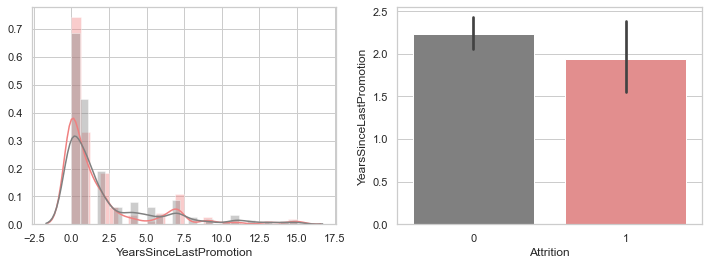

Attrition
0    2.234388
1    1.945148
Name: YearsSinceLastPromotion, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 0.19865128276906294


Comparação para YearsWithCurrManager


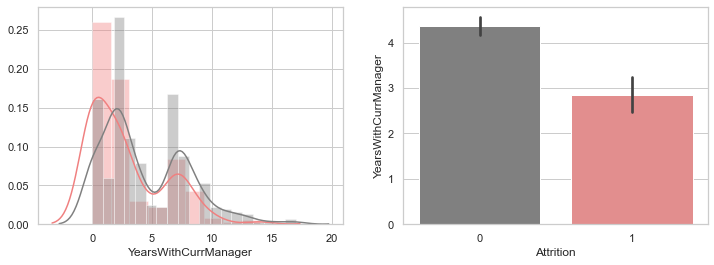

Attrition
0    4.367397
1    2.852321
Name: YearsWithCurrManager, dtype: float64


P-valor para diferença de médias entre amostras Attrition e No-Attririon: 1.1850219000030649e-10




In [10]:
numerical_columns = [
    'Age',
    'BusinessTravel',
    'DailyRate',
    'DistanceFromHome',
    'Education',
    'EnvironmentSatisfaction',
    'JobInvolvement',
    'JobSatisfaction',
    'MonthlyIncome',
    'RelationshipSatisfaction',
    'StockOptionLevel',
    'TotalWorkingYears',
    'TrainingTimesLastYear',
    'WorkLifeBalance',
    'YearsAtCompany',
    'YearsInCurrentRole',
    'YearsSinceLastPromotion',
    'YearsWithCurrManager'
] 

pvalues_numerical_columns = {
    'variável': numerical_columns,
    'P valor': []
}

for numerical_column in numerical_columns:
    print(f'Comparação para {numerical_column}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
    sns.distplot(df_small[df_small['Attrition']==1][numerical_column], color='lightcoral', ax=ax1)
    sns.distplot(df_small[df_small['Attrition']==0][numerical_column], color='grey', ax=ax1)
    sns.barplot(data=df_small, x='Attrition', y=numerical_column, palette={1: 'lightcoral', 0: 'grey'}, ax=ax2)
    plt.show()

    print(df_small.groupby(['Attrition']).mean()[numerical_column])

    t_statistic, pvalue = ttest_ind(
        df_small[df_small['Attrition']==1][numerical_column], 
        df_small[df_small['Attrition']==0][numerical_column],
        equal_var=False  # Não assumir que amostras possuem a mesma variância
    )
    pvalues_numerical_columns['P valor'].append(pvalue)

    print('\n')
    print(f'P-valor para diferença de médias entre amostras Attrition e No-Attririon: {pvalue}')
    print('\n')

In [11]:
pd.DataFrame(pvalues_numerical_columns).set_index('variável').sort_values('P valor')

,P valor
variável,
MonthlyIncome,4.433589e-13
TotalWorkingYears,1.159817e-11
YearsInCurrentRole,3.187390e-11
YearsWithCurrManager,1.185022e-10
Age,1.379760e-08
YearsAtCompany,2.285905e-07
StockOptionLevel,2.811541e-07
BusinessTravel,1.802667e-06
JobInvolvement,4.681195e-06


### Conclusão - variáveis numéricas

Há discrepância significativa para todas as variáveis numéricas, exceto `Education`, `YearsSinceLastPromotion` e `RelationshipSatisfaction`.

Médias **menores** entre os colaboradores que deixaram a empresa:
- `MonthlyIncome`;
- `TotalWorkingYears`;
- `YearsInCurrentRole`;
- `YearsWithCurrManager`;
- `Age`;
- `YearsAtCompany`;
- `StockOptionLevel`;
- `JobInvolvement`;
- `JobSatisfaction`;
- `EnvironmentSatisfaction`;
- `TrainingTimesLastYear`;
- `DailyRate`;
- `WorkLifeBalance`.

Médias **maiores** entre os colaboradores que deixaram a empresa:
- `BusinessTravel`;
- `DistanceFromHome`.

### Comportamento de Attrition em variáveis dicotômicas (1/0)

Indagação: 
> Será que, em alguma variável dictômica, existe discrepância significativa na proporção de pessoas que deixaram a empresa quando essa variável é 1, em relação a quando essa variável é 0? 

Validação:
- Verificar se há diferença nítida entre os percentuais de Attrition quando a variável dicotômica assume valor 1 ou 0 usando gráficos de barras com margem de erro;
- Aplicar teste de hipóteses para diferença de proporções entre duas populações (variável dicotômica = 1 versus variável dicotômica = 0). P-valor baixo implica que há diferença significativa.

Comparação para Gender


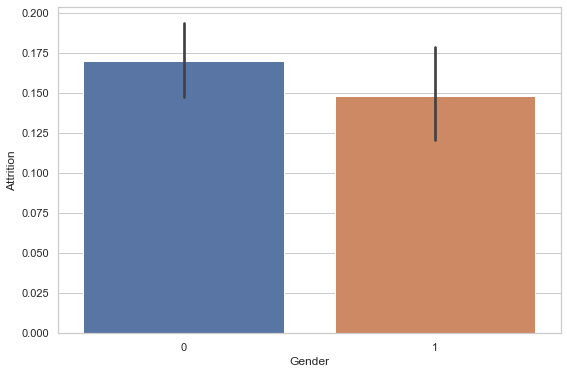

Gender
0    0.170068
1    0.147959
Name: Attrition, dtype: float64


P-valor para diferença de proporções de Attrition entre amostras Gender=1 e Gender=0: 0.2587903704911598


Comparação para OverTime


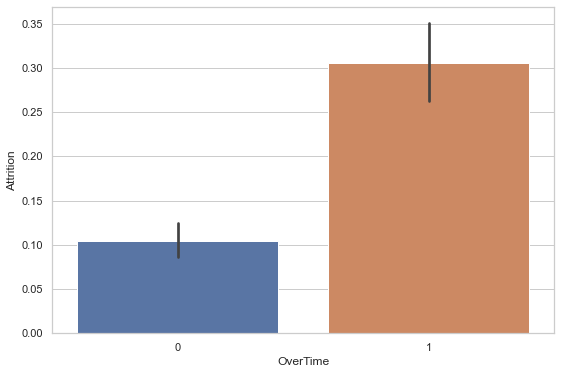

OverTime
0    0.104364
1    0.305288
Name: Attrition, dtype: float64


P-valor para diferença de proporções de Attrition entre amostras OverTime=1 e OverTime=0: 3.8615179104328466e-21


Comparação para PromotedAtCompany


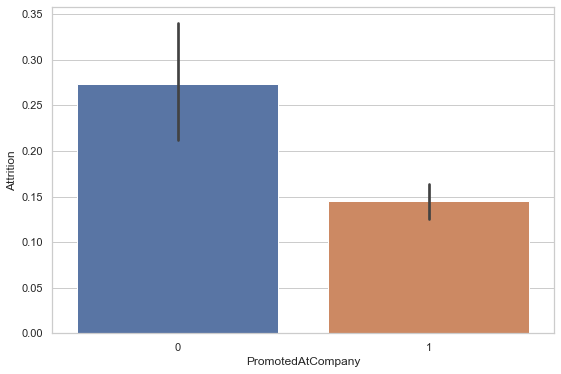

PromotedAtCompany
0    0.273743
1    0.145624
Name: Attrition, dtype: float64


P-valor para diferença de proporções de Attrition entre amostras PromotedAtCompany=1 e PromotedAtCompany=0: 1.2524470715631792e-05




In [12]:
boolean_columns = [
    'Gender',
    'OverTime',
    'PromotedAtCompany'
]

pvalues_boolean_columns = {
    'variável': boolean_columns,
    'P valor': []
}

for boolean_column in boolean_columns:
    print(f'Comparação para {boolean_column}')

    sns.barplot(data=df_small, x=boolean_column, y='Attrition')
    plt.show()

    print(df.groupby(boolean_column).mean()['Attrition'])

    event_count_a_b = np.array([
        len(df_small[(df_small['Attrition']==1) & (df_small[boolean_column]==1)]), 
        len(df_small[(df_small['Attrition']==1) & (df_small[boolean_column]==0)])
    ])

    sample_size_a_b = np.array([
        len(df_small[df_small[boolean_column]==1]), 
        len(df_small[df_small[boolean_column]==0])
    ])

    z_statistic, pvalue = proportions_ztest(count=event_count_a_b, nobs=sample_size_a_b)
    pvalues_boolean_columns['P valor'].append(pvalue)

    print('\n')
    print(f'P-valor para diferença de proporções de Attrition entre amostras {boolean_column}=1 e {boolean_column}=0: {pvalue}')
    print('\n')

In [13]:
pd.DataFrame(pvalues_boolean_columns).set_index('variável').sort_values('P valor')

,P valor
variável,
OverTime,3.861518e-21
PromotedAtCompany,1.252447e-05
Gender,2.587904e-01


### Conclusão - variáveis dicotômicas

Há discrepância significativa para todas as variáveis dicotômicas `OverTime` e `PromotedAtCompany`, mas não há em `Gender`.

- `OverTime`: percentual de Attrition é **maior** quando essa variável assume o **valor 1**;
- `PromotedAtCompany`: : percentual de Attrition é **maior** quando essa variável assume o **valor 0**;

### Comportamento de Attrition em variáveis multicategóricas

Indagação: 
> Será que, em alguma variável categórica, existe discrepância na proporção de pessoas que deixaram a empresa para as diferentes categorias? 

Validação: 
- Verificar se há diferença nítida entre os percentuais de Attrition para cada categoria usando gráficos de barras com margem de erro;

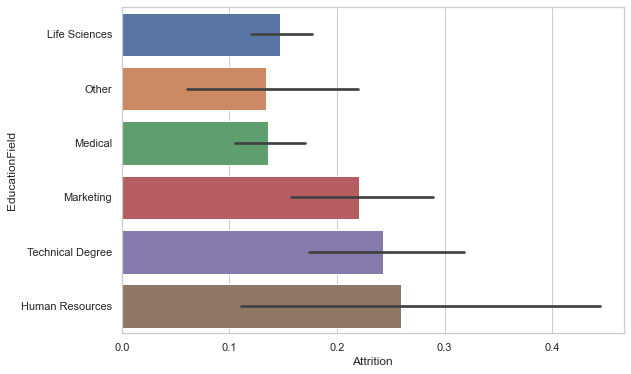

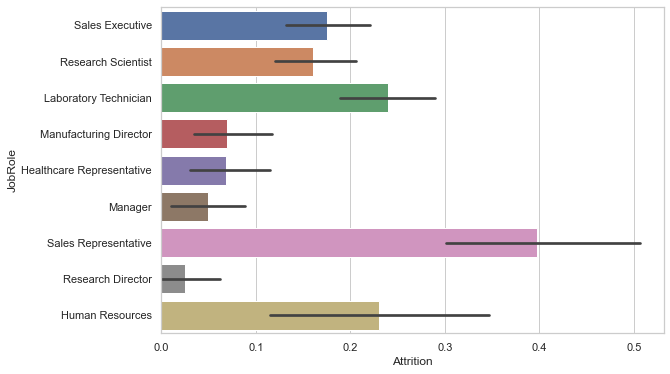

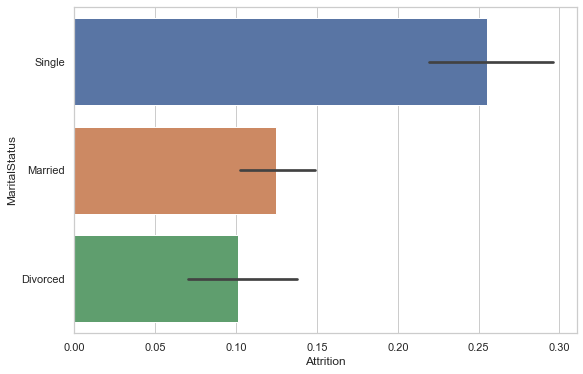

In [14]:
multicategorical_columns = [
    'EducationField',
    'JobRole',
    'MaritalStatus'
]

for multicategorical_column in multicategorical_columns:
    sns.barplot(data=df_small, x='Attrition', y=multicategorical_column, orient='h')
    plt.show()

### Conclusão - variáveis multicategóricas

Parece haver discrepância para todas as variáveis multicategóricas.

- `EducationField`: percentual de Attrition é **maior** nas categorias `Marketing`, `Technical Degree` e `Human Resources`;
- `JobRole`: : percentual de Attrition é **maior** na categoria `Sales Representative`;
- `MaritalStatus`: percentual de Attrition é **maior** na categoria `Single`.

In [15]:
# One Hot Encoding: transformar variáveis multicategóricas em dummies (1/0).
# Para cada uma delas, é importante remover uma das dummies antes de criar o modelo para evitar redundância
# Recomenda-se remover a dummy mais frequente:
# Department = R&D; EducationField = Life Sciences; JobRole = SalesExecutive; MaritalStatus = Married

df_dummy = pd.get_dummies(df_small, columns=multicategorical_columns)

print(df_dummy.shape)
df_dummy.head()

(1470, 40)


,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PromotedAtCompany,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,41,1,1,1102,1,12,2,1,3,4,5993,1,1,0,8,0,1,6,4,0,5,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,49,0,2,279,8,9,3,0,2,2,5130,0,4,1,10,3,3,10,7,1,7,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,37,1,1,1373,2,12,4,0,2,3,2090,1,2,0,7,3,3,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
5,33,0,2,1392,3,19,4,1,3,3,2909,1,3,0,8,3,3,8,7,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
7,27,0,1,591,2,9,1,0,3,2,3468,0,4,1,6,3,3,2,2,2,2,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


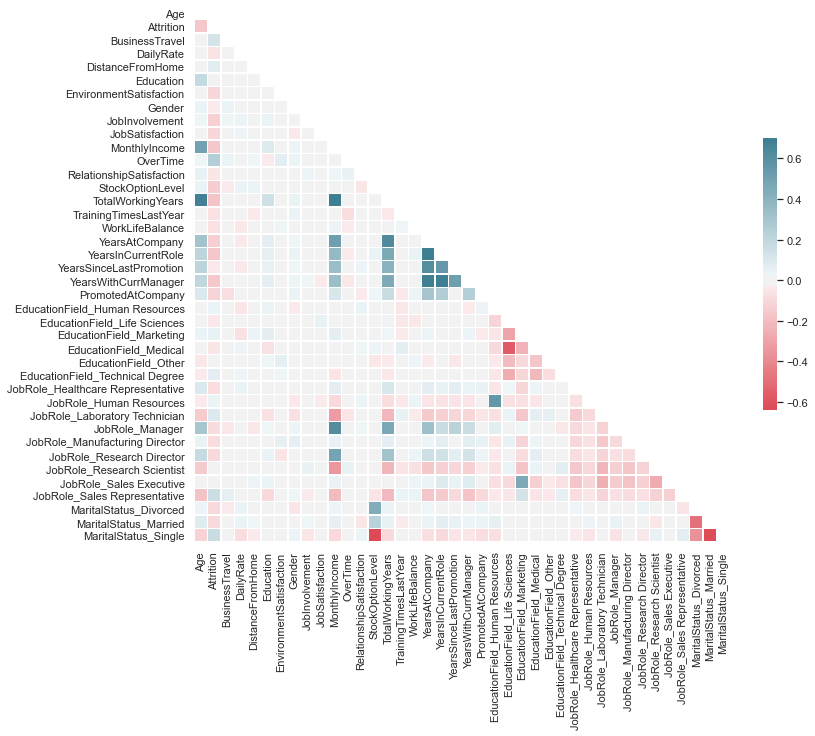

In [16]:
corr = df_dummy.corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool))

fig, ax = plt.subplots(figsize=(12, 10))

cmap = sns.diverging_palette(10, 220, as_cmap=True)

sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=.7,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5}
)

Alta correlação entre variáveis que estão expressas em anos:
- `Age`;
- `TotalWorkingYears`;
- `YearsAtCompany`;
- `YearsInCurrentRole`;
- `YearsSinceLastPromotion`;
- `YearsWithCurrManager`.

Para diminuir o efeito de multicolinearidade, serão mantidas apenas: `Age`, `YearsAtCompany` e `YearsInCurrentRole`.

In [17]:
drop_columns = [
#     Variável resposta:
    'Attrition',
#     Multicolinearidade:
    'TotalWorkingYears',
    'YearsSinceLastPromotion',
    'YearsWithCurrManager',
#     Dummies mais frequentes:
    'EducationField_Life Sciences',
    'JobRole_Sales Executive',
    'MaritalStatus_Married'
]

# X = variáveis explicativas, y = variável resposta
X, y = df_dummy.drop(columns=drop_columns), df_dummy['Attrition']

print(X.shape)
X.head()

(1470, 33)


,Age,BusinessTravel,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,PromotedAtCompany,EducationField_Human Resources,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Single
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,41,1,1102,1,12,2,1,3,4,5993,1,1,0,0,1,6,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,49,2,279,8,9,3,0,2,2,5130,0,4,1,3,3,10,7,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,37,1,1373,2,12,4,0,2,3,2090,1,2,0,3,3,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1
5,33,2,1392,3,19,4,1,3,3,2909,1,3,0,3,3,8,7,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,27,1,591,2,9,1,0,3,2,3468,0,4,1,3,3,2,2,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0


## Modelagem preditiva dos dados

Utilizar os atributos existentes em `X` para prever a classe da variável resposta `y`.

In [18]:
# Split do dataset em treino (para criar e iterar o modelo) e teste (para validá-lo perante dados não vistos)
# Stratify = garantir que a proporção de attrition será igual tanto no dataset de treino como no de teste

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

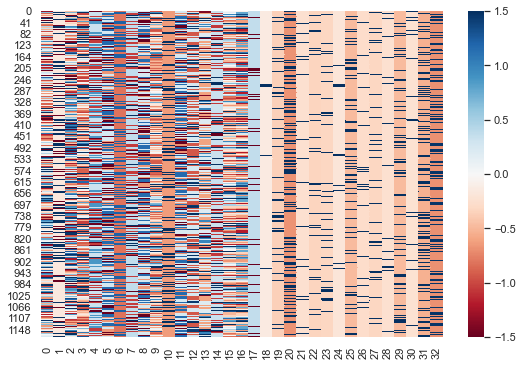

In [19]:
# Normalizar os dados, trazendo-os para uma escala mais apropriada
# z = (x - mean)/std => mean = 0 var = 1
# Agiliza os cálculos e permite tirar conclusões a mais dos coeficientes do modelo de Regressão

scaler = StandardScaler()
X_train_normalized = scaler.fit_transform(X_train)
X_test_normalized = scaler.transform(X_test)

# Mapa de calor dos dados normalizados
sns.heatmap(X_train_normalized, vmin=-1.5, vmax=1.5, center=0, cmap='RdBu')
plt.show()

### Algoritmos de classificação utilizados: Regressão Logística e Random Forests

**Motivo**: enquanto Regressão Logística é um modelo simples, de alta interpretabilidade e explicabilidade, Random Forests é uma combinação de modelos de Árvore de Decisão que não pressupõe linearidade entre a variável resposta e as features, e apesar de não ser tão interpretável como a Regressão Logística, também permite análise de importância de feature.

`class_weight`: importância (peso) da classe predita ao calcular função de custo (que será minimizada a cada iteração). No contexto de um dataset desbalanceado (com poucas observações da classe positiva) e sabendo que a classe positiva (Attrition) é a classe de interesse, faz sentido atribui-la um peso maior.

In [20]:
log_regression = LogisticRegression(max_iter=100, random_state=42, class_weight={0: 1, 1: 5})
forest = RandomForestClassifier(n_estimators=100, random_state=42, class_weight={0: 1, 1: 5})

### Modelo 1: Regressão Logística

#### Valor dos coeficientes da regressão

Como os dados foram normalizados, é possível inferir que: 

* Coeficientes **próximos de 0** indicam que a feature é **menos relevante** para a predição.
* Coeficientes muito **positivos** = quanto maior o valor nessa coluna, **maior** a chance de haver Attrition;
* Coeficientes muito **negativos** = quanto maior o valor nessa coluna, **menor** a chance de haver Attrition.

In [21]:
log_regression.fit(X_train_normalized, y_train)

pd.DataFrame(
    data=log_regression.coef_.T, 
    index=X.columns, 
    columns=['Coeficientes']
).sort_values('Coeficientes', ascending=False)

,Coeficientes
OverTime,0.714309
BusinessTravel,0.434187
DistanceFromHome,0.271887
MonthlyIncome,0.248942
JobRole_Sales Representative,0.247320
MaritalStatus_Single,0.243406
JobRole_Laboratory Technician,0.228914
EducationField_Technical Degree,0.194595
EducationField_Human Resources,0.152146
Education,0.031864


#### Interpretação dos coeficientes

Probabilidade de Attrition é **maior** para valores **mais altos** de:
- `OverTime`;
- `BusinessTravel`;
- `DistanceFromHome`.

Probabilidade de Attrition é **maior** para valores **mais baixos** de:
- `JobRole_Research Director` e `JobRole_Healthcare Representative` (em comparação com o grupo padrão `Sales Executive`);
- `YearsWithCurrManager`;
- `EnvironmentSatisfaction`;
- `JobSatisfaction`.

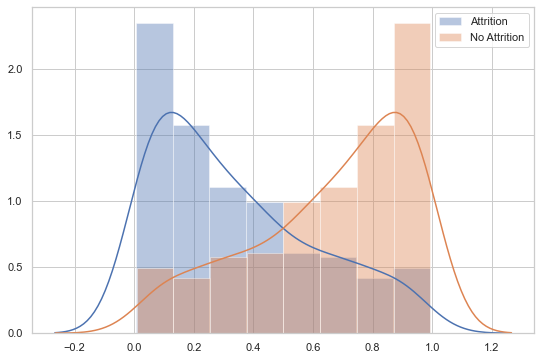

In [22]:
# Classe predita utilizando treshold = 0.5 (Probabilidade de attrition > 50% => classificado como attrition)
y_pred = log_regression.predict(X_test_normalized)

# Distribuição das probabilidades de pertencimento a cada classe
y_pred_probs = log_regression.predict_proba(X_test_normalized)
sns.distplot(y_pred_probs[:, 1], label='Attrition')
sns.distplot(y_pred_probs[:, 0], label='No Attrition')
plt.legend()
plt.show()

#### Matriz de confusão

Mostra a distribuição de Verdadeiros Positivos/Negativos e Falsos Positivos/Negativos, ao comparar as predições com os valores reais. Um bom modelo acerta tanto nos diagnósticos negativos como nos positivos.

Entretanto, essa matriz considera apenas o **threshold de 50%** (probabilidade de haver attrition acima de 50% -> classificado como positivo), não contemplando outros thresholds. 

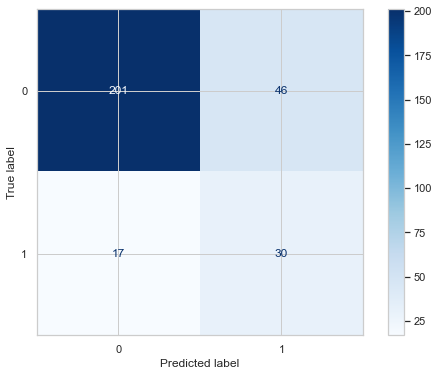

In [23]:
plot_confusion_matrix(log_regression, X_test_normalized, y_test, cmap='Blues')
plt.show()

#### Relatório de classificação

- **Precision**: quantos dos diagnosticados positivos de fato são. A cada 100 saídas que o modelo apontou como positivos, X% de fato são positivos;
- **Recall**: quantos do universo de positivos o modelo consegue detectar. A cada 100 observações que pertencem à classe positiva, X% o meu modelo apontou como positivos;
- **F1 Score**: média harmônica entre *Precision* e *Recall*. É baixo quando um dos dois ou ambos forem baixos, e alto quando ambos são altos;
- **Acurácia**: Percentual de diagnósticos certeiros, sejam eles positivos ou negativos. **Não é uma métrica muito fiel em caso de datasets desbalanceados**, como é o caso desse.

Esse relatório também mostra métricas apenas no threshold de 50%.

In [24]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.81      0.86       247
           1       0.39      0.64      0.49        47

    accuracy                           0.79       294
   macro avg       0.66      0.73      0.68       294
weighted avg       0.84      0.79      0.80       294



#### Curva ROC

Calcula, para cada threshold, quanto foi a taxa de verdadeiros positivos e a taxa de falsos positivos. Quanto mais próxima do canto superior esquerdo (0,1) a curva estiver, maior será a área abaixo da curva e mais certeiro é o modelo. Quanto mais próximo da linha pontilhada (cuja área é 0.50), pior o modelo.

Essa curva permite comparar melhor modelos diferentes, pois a área abaixo da curva é calculada considerando todos os thresholds. Entretanto, ela perde poder de comparação quanto mais desbalanceado for o dataset.

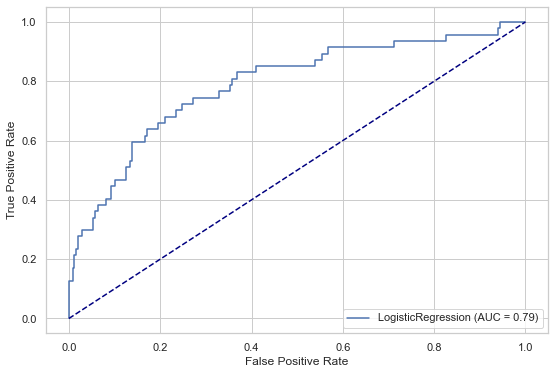

In [25]:
roc_curve_model_1 = plot_roc_curve(log_regression, X_test_normalized, y_test)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.show() 

#### Curva Precision-Recall

**Dilema do limiar**: quanto maior o threshold (régua, ou limiar de classificação), mais exigente o modelo é para classificar uma observação como pertencente à classe positiva, portanto maior a precisão e menor o recall.

A curva Precision-Recall plota a precisão e o recall para cada threshold e mostra o quanto se perde em precisão conforme aumenta o recall. Quanto maior a área abaixo dessa curva, melhor o modelo, e quanto mais próxima a curva estiver da linha pontilhada horizontal (percentual de observações na classe positiva), pior o modelo. A precisão média (ou `AP - Average Precision`), que é a média ponderada da precisão em diferentes thresholds é uma métrica que resume bem essa curva.

A curva Precision-Recall também é adequada para comparar modelos, inclusive quando o dataset está desbalanceado. Portanto, um bom critério de escolha é o modelo que apresentar maior precisão média.

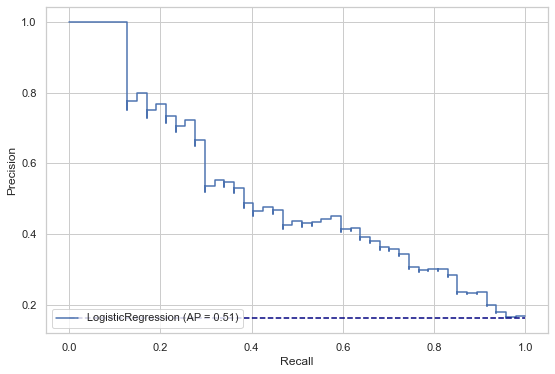

In [26]:
precision_recall_curve_model_1 = plot_precision_recall_curve(log_regression, X_test_normalized, y_test)
plt.plot([0,1], [y.mean(), y.mean()], color='navy', linestyle='--')
plt.show()

#### Precisão, Recall e F1 Score para cada threshold

Curva útil para ver como as três métricas se comportam para diferentes thresholds, e escolher o seu melhor valor para o modelo (por exemplo, o threshold que maximiza o f1 score).

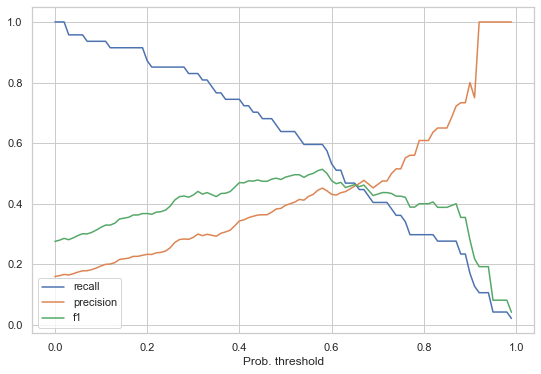

In [27]:
precisions = []
recalls = []
f1s=[]

for i in range(100):
    threshold_prob = i/100
    y_hat = (y_pred_probs[:,1] >= threshold_prob).astype(bool)
    
    precision = precision_score(y_test.values, y_hat)
    recall = recall_score(y_test.values, y_hat)
    f1 = f1_score(y_test.values, y_hat)
    
    precisions.append(precision)
    recalls.append(recall)
    f1s.append(f1)
    
probs = [i/100 for i in range(100)]
sns.lineplot(x=probs, y=recalls, label='recall')
sns.lineplot(x=probs, y=precisions, label='precision')
sns.lineplot(x=probs, y=f1s, label='f1')
plt.xlabel('Prob. threshold')
plt.show()

In [28]:
max_f1_model_1 = max(f1s)
max_f1_threshold_model_1 = f1s.index(max_f1_model_1)
precision_model_1 = precisions[max_f1_threshold_model_1]
recall_model_1 = recalls[max_f1_threshold_model_1]

print(f"Threshold {max_f1_threshold_model_1/100} maximiza f1 score para {max_f1_model_1}")
print(f"Nesse threshold, a precisão é de {precision_model_1} e o recall é de {recall_model_1}")

Threshold 0.58 maximiza f1 score para 0.5137614678899082
Nesse threshold, a precisão é de 0.45161290322580644 e o recall é de 0.5957446808510638


### Modelo 2: Random Forest

#### Importância das features

Quanto mais vezes uma variável for usada nas ramificações das árvores de decisão, mais importante ela se mostra para a predição.

In [29]:
forest.fit(X_train_normalized, y_train)

pd.DataFrame(
    data=forest.feature_importances_.T, 
    index=X.columns, 
    columns=['Relevância da feature']
).sort_values('Relevância da feature', ascending=False)

,Relevância da feature
MonthlyIncome,0.112629
Age,0.097533
YearsAtCompany,0.078961
DailyRate,0.078463
DistanceFromHome,0.063756
OverTime,0.049544
YearsInCurrentRole,0.048720
EnvironmentSatisfaction,0.041652
StockOptionLevel,0.039934
JobSatisfaction,0.034947


**Variáveis que se mostraram mais relevantes nesse modelo**:

- `MonthlyIncome`
- `Age`
- `DailyRate`
- `YearsAtCompany`
- `DistanceFromHome`
- `YearsWithCurrManager`
- `OverTime`

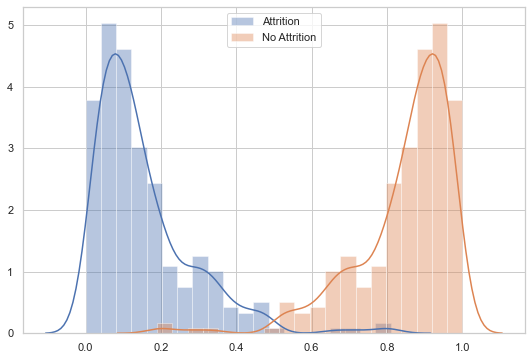

In [30]:
# Classe predita utilizando treshold = 0.5 (Probabilidade de attrition > 50% => classificado como attrition)
y_pred = forest.predict(X_test_normalized)

# Distribuição das probabilidades de pertencimento a cada classe
y_pred_probs = forest.predict_proba(X_test_normalized)
sns.distplot(y_pred_probs[:, 1], label='Attrition')
sns.distplot(y_pred_probs[:, 0], label='No Attrition')
plt.legend()
plt.show()

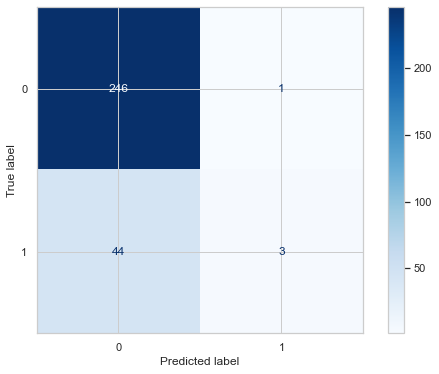

In [31]:
plot_confusion_matrix(forest, X_test_normalized, y_test, cmap='Blues')
plt.show()

In [32]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92       247
           1       0.75      0.06      0.12        47

    accuracy                           0.85       294
   macro avg       0.80      0.53      0.52       294
weighted avg       0.83      0.85      0.79       294



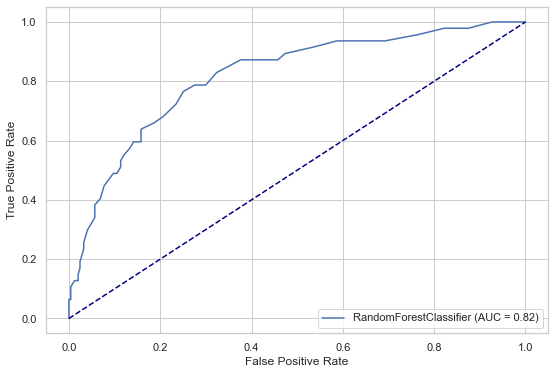

In [33]:
roc_curve_model_2 = plot_roc_curve(forest, X_test_normalized, y_test)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.show() 

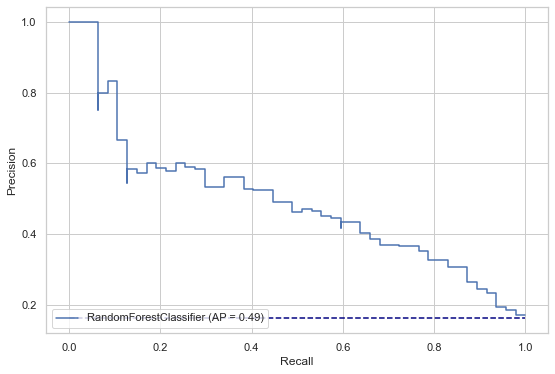

In [34]:
precision_recall_curve_model_2 = plot_precision_recall_curve(forest, X_test_normalized, y_test)
plt.plot([0,1], [y.mean(), y.mean()], color='navy', linestyle='--')
plt.show()

/Users/vitorfaria/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


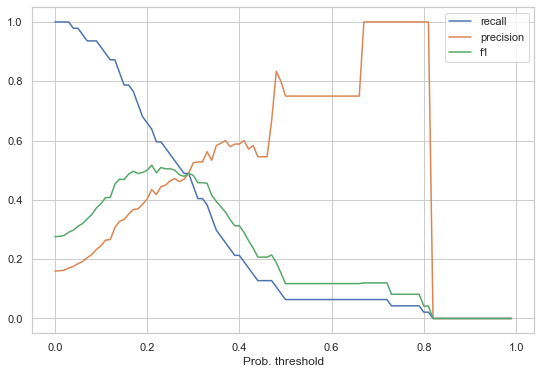

In [35]:
precisions = []
recalls = []
f1s=[]

for i in range(100):
    threshold_prob = i/100
    y_hat = (y_pred_probs[:,1] >= threshold_prob).astype(bool)
    
    precision = precision_score(y_test.values, y_hat)
    recall = recall_score(y_test.values, y_hat)
    f1 = f1_score(y_test.values, y_hat)
    
    precisions.append(precision)
    recalls.append(recall)
    f1s.append(f1)
    
probs = [i/100 for i in range(100)]
sns.lineplot(x=probs, y=recalls, label='recall')
sns.lineplot(x=probs, y=precisions, label='precision')
sns.lineplot(x=probs, y=f1s, label='f1')
plt.xlabel('Prob. threshold')
plt.show()

In [36]:
max_f1_model_2 = max(f1s)
max_f1_threshold_model_2 = f1s.index(max_f1_model_2)
precision_model_2 = precisions[max_f1_threshold_model_2]
recall_model_2 = recalls[max_f1_threshold_model_2]

print(f"Threshold {max_f1_threshold_model_2/100} maximiza f1 score para {max_f1_model_2}")
print(f"Nesse threshold, a precisão é de {precision_model_2} e o recall é de {recall_model_2}")

Threshold 0.21 maximiza f1 score para 0.5172413793103449
Nesse threshold, a precisão é de 0.43478260869565216 e o recall é de 0.6382978723404256


In [37]:
model_comparison = pd.DataFrame({
    "Modelo": [
        "Regressão Logística",
        "Random Forests"
    ],
    "ROC AUC": [
        roc_curve_model_1.roc_auc,
        roc_curve_model_2.roc_auc
    ],
    "Avg Precision": [
        precision_recall_curve_model_1.average_precision,
        precision_recall_curve_model_2.average_precision
    ],
    "Max F1 Score": [
        max_f1_model_1,
        max_f1_model_2
    ],
    "Threshold Max F1 Score": [
        max_f1_threshold_model_1/100,
        max_f1_threshold_model_2/100
    ],
    "Precisão no Threshold Max F1 Score": [
        precision_model_1,
        precision_model_2
    ],
    "Recall no Threshold Max F1 Score": [
        recall_model_1,
        recall_model_2
    ]
}, index=[1, 2])

model_comparison

,Modelo,ROC AUC,Avg Precision,Max F1 Score,Threshold Max F1 Score,Precisão no Threshold Max F1 Score,Recall no Threshold Max F1 Score
1,Regressão Logística,0.789215,0.514628,0.513761,0.58,0.451613,0.595745
2,Random Forests,0.817125,0.491014,0.517241,0.21,0.434783,0.638298


## Conclusão - Modelagem

Analisando as métricas dos modelos desenvolvidos, é possível ver que os modelos tiveram performance bastante similares, porém a **Regressão Logística** se saiu melhor em Precisão Média - que é a métrica mais adequada para datasets em que a variável resposta é desbalanceada.

Operando em um threshold que maximiza o seu F1 score, esse modelo é **capaz de detectar 60% dos casos de attrition** (recall) e, a cada 100 diagnósticos positivos (pessoas classificadas pelo modelo como pertencentes à classe de attrition), **45 são corretos** (precisão). Não são métricas das melhores, porém são satisfatórias para usar a interpretação dos coeficientes do modelo como base para ações de RH.

### Construção do modelo com todos os dados

Escolhido o modelo com base em métricas de teste, o próximo passo é treinar o modelo escolhido com todo o dataset, para interpretá-lo e gerar saídas para a área de Gente

In [38]:
log_regression = LogisticRegression(max_iter=1000, random_state=42, class_weight={0: 1, 1: 5})
X_normalized = scaler.fit_transform(X)
log_regression.fit(X_normalized, y)

pd.DataFrame(
    data=log_regression.coef_.T, 
    index=X.columns, 
    columns=['Coeficientes da regressão']
).sort_values('Coeficientes da regressão', ascending=False)

,Coeficientes da regressão
OverTime,0.764183
YearsAtCompany,0.397962
BusinessTravel,0.395631
EducationField_Technical Degree,0.302478
MaritalStatus_Single,0.286651
DistanceFromHome,0.258897
JobRole_Sales Representative,0.246399
JobRole_Laboratory Technician,0.171295
EducationField_Human Resources,0.123014
EducationField_Marketing,0.060595


### Saídas para time de Gente

- Pessoas que fazem horas extras (`OverTime = 1`) aparentemente são mais propensas ao Attrition, portanto seria interessante um esforço em conjunto com as lideranças para desincentivar essa prática entre os colaboradores;
- De um lado, valores altos de `YearsAtCompany` estão associados a maior probabilidade de Attrition, enquanto valores altos de `YearsInCurrentRole` estão associados a menor probabilidade. Isso pode indicar que a troca de posições/equipes/gestor pode influenciar negativamente na experiência do colaborador. Nesse sentido, pode ser importante acompanhar mais de perto pessoas com muito tempo de casa que passaram por alguma transição;
- Variáveis associadas a desolocamentos (como `BusinessTravel`, que representa a frequência de viagens de negócios e `DistanceFromHome`, que representa a distância entre casa e trabalho) mostram que um maior tempo de deslocamento/frequência de viagens podem contribuir para o Attrition. Sendo assim, práticas como HomeOffice/FlexOffice e conferências remotas que diminuam a necessidade de deslocamentos poderiam ser incentivadas;
- Como esperado, valores altos de `EnvironmentSatisfaction`, `JobSatisfaction` e `JobInvolvement` estão associados a uma menor probabilidade de attrition, portanto medidas que aumentam o engajamento e a satisfação com o trabalho e clima (como troca de feedbacks construtivos, Planos de Desenvolvimento Individual e clima amistoso entre os colaboradores) podem influenciar positivamente na prevenção.

### Sugestão de próximas análises

- Analisar efeito de interação de múltiplas variáveis, que juntas pode ter um efeito somado maior na ocorrência de Attrition do que separadas;
- Uso de Shap Values para ganhar interpretabilidade local e possibilitar ações locais (entender o que mais contribuiu  para um colaborador específico ter Attrition ou não);
- Investigar a existência de possíveis clusters no dataset, que tenham comportamentos diferentes do comportamento global - especialmente entre as duas subpopulações existentes em `YearsInCurrentRole` e `YearsWithCurrManager`;
- Utilizar validação cruzada para diminuir o efeito da aleatoriedade do split entre treino e teste e avaliar possível underfitting/overfitting.